# Autoencoders for Image Denoising

*  *Notebook prepared by Maxim Ziatdinov  (email: maxim.ziatdinov@gmail.com)*

*  *The simulated data (atomic coordinates) comes from MD calculations by Bobby Sumpter and Ayana Ghosh at Oak Ridge National Lab*

*  *Experimental data by Ondrej Dyck at Oak ridge National Lab*



---


This notebook provides a simple example of training a denoising Autoencoder for simple image cleaning (denoising) using [AtomAI](https://github.com/pycroscopy/atomai). Generally, autoencoders refer to the class of the neural networks that compress the data set to a small number of bottleneck features, and then expand back to original data size. The training aims to minimize information loss between the initial and reconstructed images via usual backpropagation. This process tends to select the relevant features in the data set and reject the noise, giving rise to applications for denoising.


---







Install AtomAI:

In [1]:
!pip install git+https://github.com/pycroscopy/atomai # install the latest version from source

  Cloning https://github.com/ziatdinovmax/atomai to /tmp/pip-req-build-bazqr07w
  Running command git clone --filter=blob:none --quiet https://github.com/ziatdinovmax/atomai /tmp/pip-req-build-bazqr07w
  Resolved https://github.com/ziatdinovmax/atomai to commit 8e73c92285be759edf713d23eac9dfa2763918eb
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 11.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.7/277.7 kB 27.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 131.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 98.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211

Imports:

In [2]:
import atomai as aoi

import numpy as np
import matplotlib.pyplot as plt

Define a helper function for preparing data:

In [3]:
def split_denoising_data(imgdata_noisy, imgdata, test_size=0.2, holdout_size=0.2, random_state=42):

    from sklearn.model_selection import train_test_split

    # First split: separate holdout set
    X_noisy_temp, X_noisy_holdout, X_clean_temp, X_clean_holdout = train_test_split(
        imgdata_noisy, imgdata, test_size=holdout_size, random_state=random_state
    )

    # Second split: train/test from remaining data
    relative_test_size = test_size / (1 - holdout_size)
    X_noisy_train, X_noisy_test, X_clean_train, X_clean_test = train_test_split(
        X_noisy_temp, X_clean_temp, test_size=relative_test_size,
        random_state=random_state + 1
    )

    return (X_noisy_train, X_noisy_test, X_noisy_holdout,
            X_clean_train, X_clean_test, X_clean_holdout)


def scale_to_training_range(expdata, training_data):
    scale_factor = training_data.max() / expdata.max()
    return expdata * scale_factor

Down(load) simulated data of graphene:

In [4]:
# Download data
!gdown -O "graphene_MD_imgs.npy" https://drive.google.com/uc?id=1iFZvHKkOLWxPVe6dlm5GTJOSimAZJCMf

Downloading...
From (original): https://drive.google.com/uc?id=1iFZvHKkOLWxPVe6dlm5GTJOSimAZJCMf
From (redirected): https://drive.google.com/uc?id=1iFZvHKkOLWxPVe6dlm5GTJOSimAZJCMf&confirm=t&uuid=d69e5139-f1aa-4749-9bc7-4c27d4f9cd14
To: /content/graphene_MD_imgs.npy
100% 3.17G/3.17G [00:11<00:00, 284MB/s]


Load data into the notebook:


In [5]:
imgdata = np.load("graphene_MD_imgs.npy")[::2] # take every 2nd sample
print(imgdata.shape)

(3023, 256, 256)


Now let's corrupt our data with noise and then use a denoising autoencoder to reconstruct the original images.

In [6]:
np.random.seed(42) # for reproducibility
# Add noise to data
imgdata_noisy = imgdata + np.random.normal(scale=8, size=imgdata.shape)

View selected pairs of images (images from the left subplot will be inputs into a neural network and images from the right subplot will be our targets)

Text(0.5, 1.0, 'Original image')

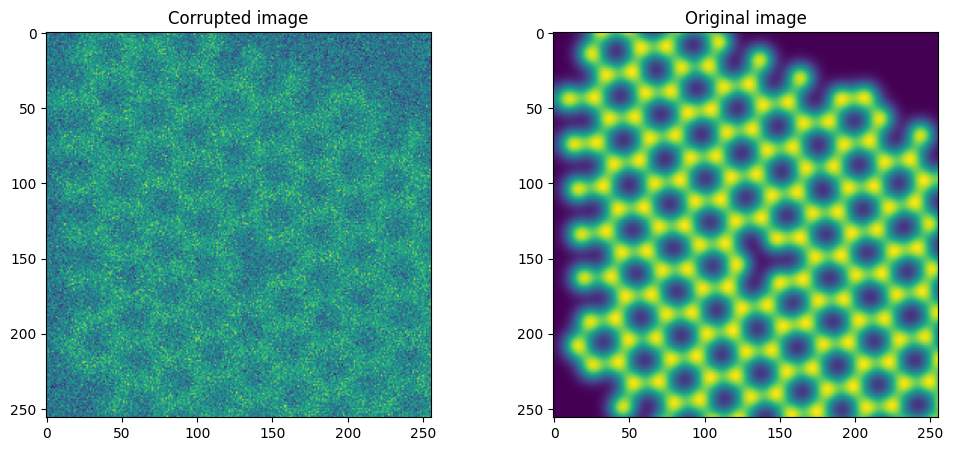

In [7]:
k = 15

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
ax1.imshow(imgdata_noisy[k])
ax2.imshow(imgdata[k])
ax1.set_title("Corrupted image")
ax2.set_title("Original image")

Split data into train, test, and holdout sets:

In [8]:
(X_noisy_train, X_noisy_test, X_noisy_holdout,
 X_clean_train, X_clean_test, X_clean_holdout) = split_denoising_data(imgdata_noisy, imgdata)

Initialize and train AtomAI's denoiser model:

/usr/local/lib/python3.11/dist-packages/atomai/utils/preproc.py:728: UserWarning: Adding channel dimension of 1 to noisy training images
  warnings.warn('Adding channel dimension of 1 to noisy training images', UserWarning)
/usr/local/lib/python3.11/dist-packages/atomai/utils/preproc.py:731: UserWarning: Adding channel dimension of 1 to clean training images
  warnings.warn('Adding channel dimension of 1 to clean training images', UserWarning)
/usr/local/lib/python3.11/dist-packages/atomai/utils/preproc.py:734: UserWarning: Adding channel dimension of 1 to noisy test images
  warnings.warn('Adding channel dimension of 1 to noisy test images', UserWarning)
/usr/local/lib/python3.11/dist-packages/atomai/utils/preproc.py:737: UserWarning: Adding channel dimension of 1 to clean test images
  warnings.warn('Adding channel dimension of 1 to clean test images', UserWarning)


Epoch 1/500 ... Training loss: 69.7853 ... Test loss: 67.9268 ... GPU memory usage: 3004/15360
Epoch 100/500 ... Training loss: 14.9284 ... Test loss: 16.3878 ... GPU memory usage: 3004/15360
Epoch 200/500 ... Training loss: 2.863 ... Test loss: 2.7031 ... GPU memory usage: 3004/15360
Epoch 300/500 ... Training loss: 1.2503 ... Test loss: 1.1813 ... GPU memory usage: 3004/15360
Epoch 400/500 ... Training loss: 1.0449 ... Test loss: 0.9334 ... GPU memory usage: 3004/15360
Epoch 500/500 ... Training loss: 1.003 ... Test loss: 0.7678 ... GPU memory usage: 3004/15360
Model (final state) evaluation loss: 0.8393
Performing stochastic weight averaging...
Model (final state) evaluation loss: 0.7606
Plotting training history


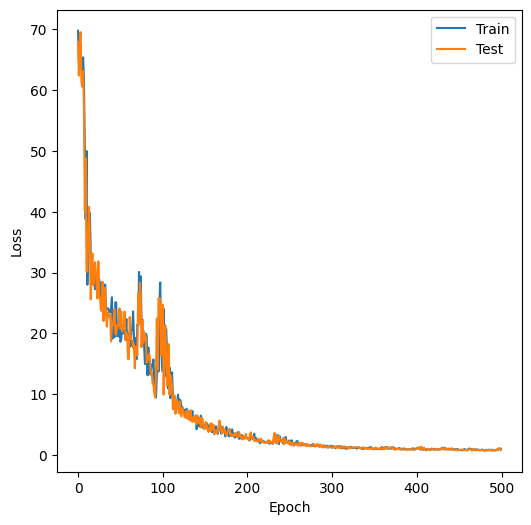

In [9]:
denoiser = aoi.models.DenoisingAutoencoder()
denoiser.fit(X_noisy_train, X_clean_train, X_noisy_test, X_clean_test)

Make a prediction on the holdout dataset:

In [10]:
prediction = denoiser.predict(X_noisy_holdout)

Plot results:

Text(0.5, 1.0, 'Difference')

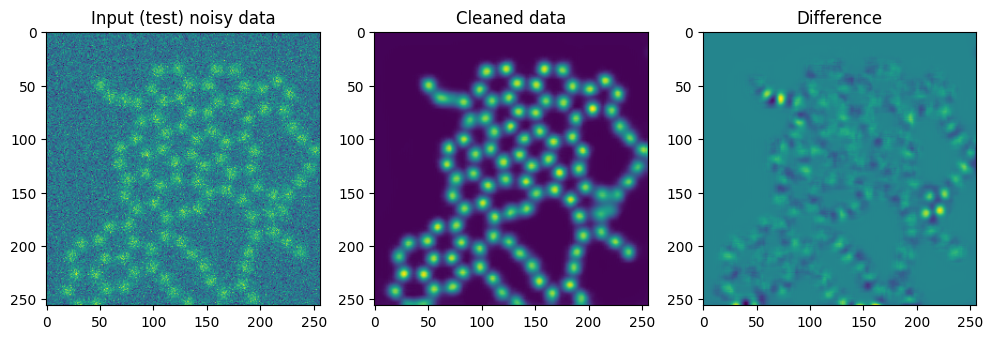

In [11]:
k = 50 # select a prediction to plot
_, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 5))
ax1.imshow(X_noisy_holdout[k])
ax2.imshow(prediction[k])
ax3.imshow(X_clean_holdout[k] - prediction[k])
ax1.set_title("Input (test) noisy data")
ax2.set_title("Cleaned data")
ax3.set_title("Difference")

Now we are going to gradually increase the noise level and see how well our model can generalize:

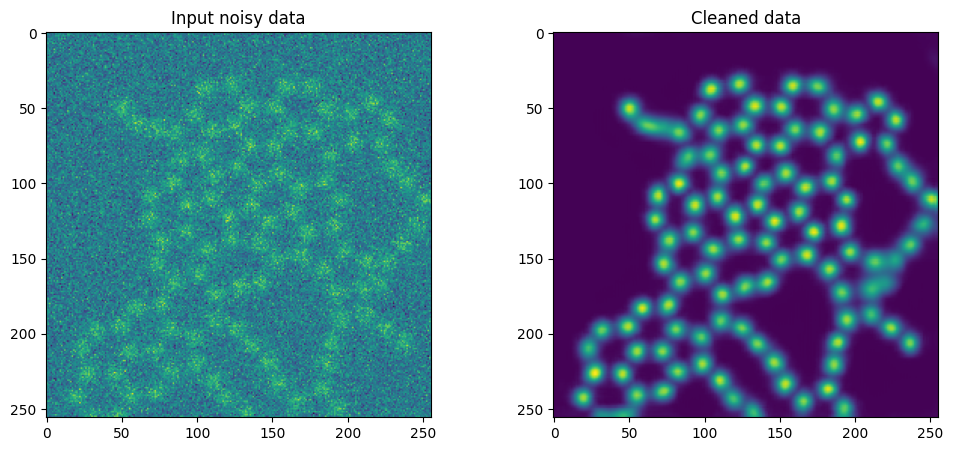

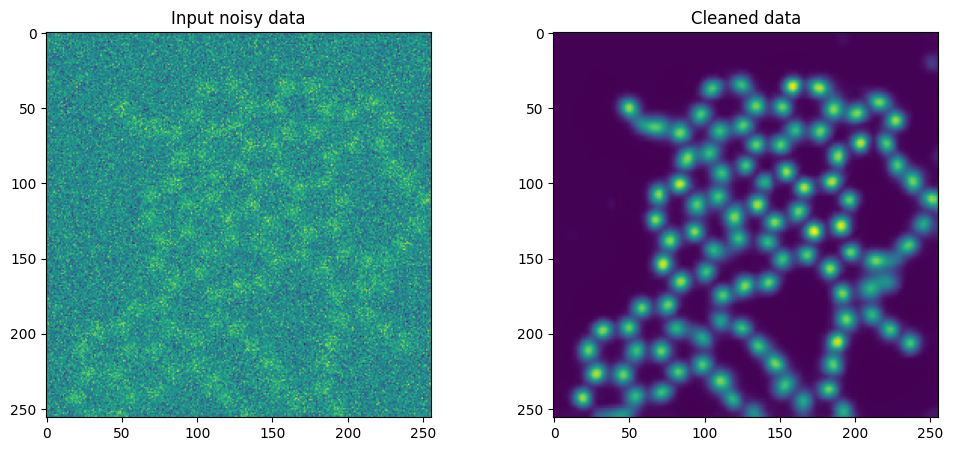

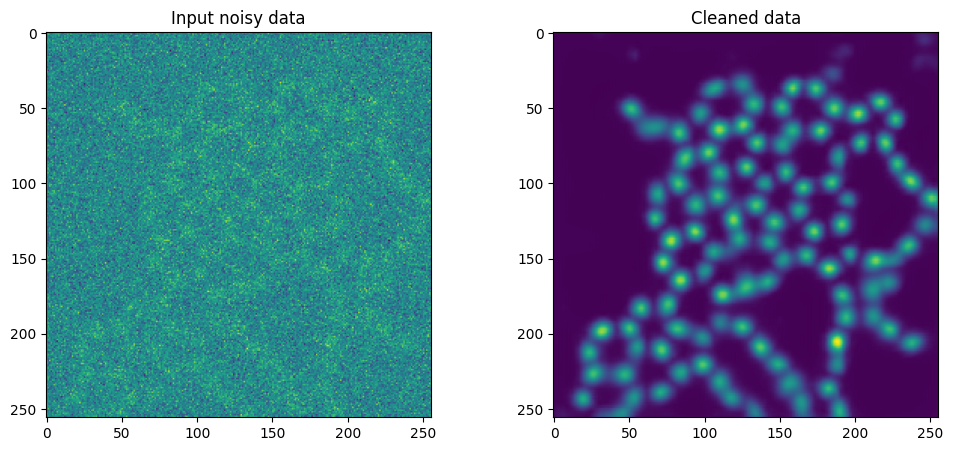

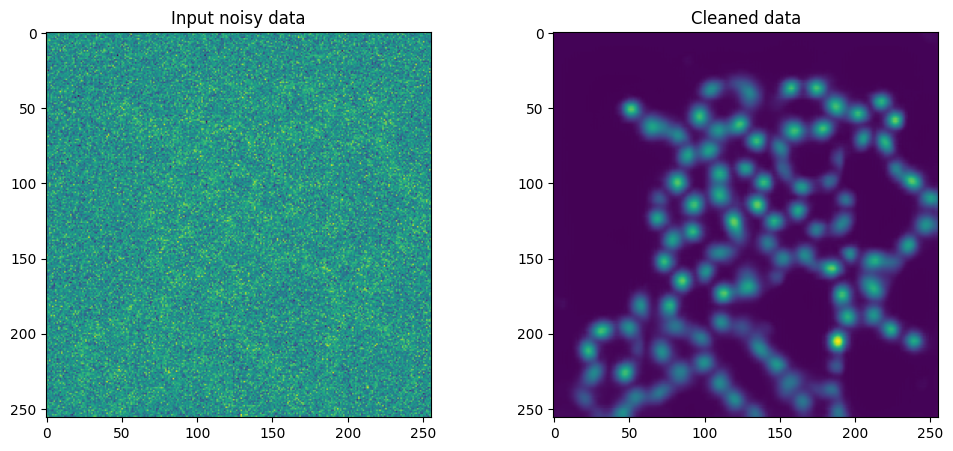

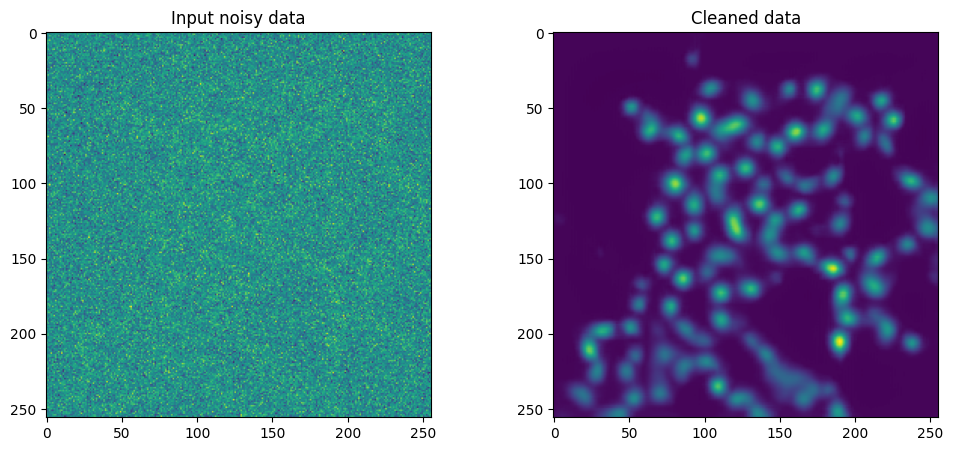

...

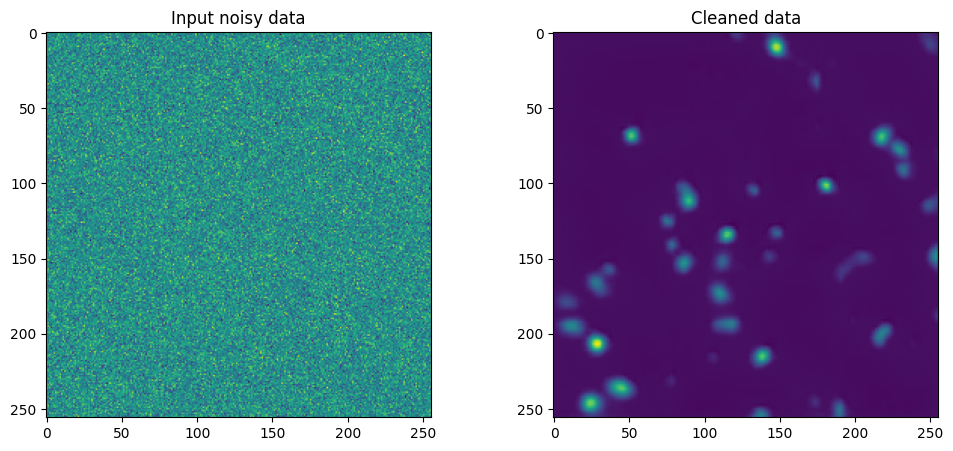

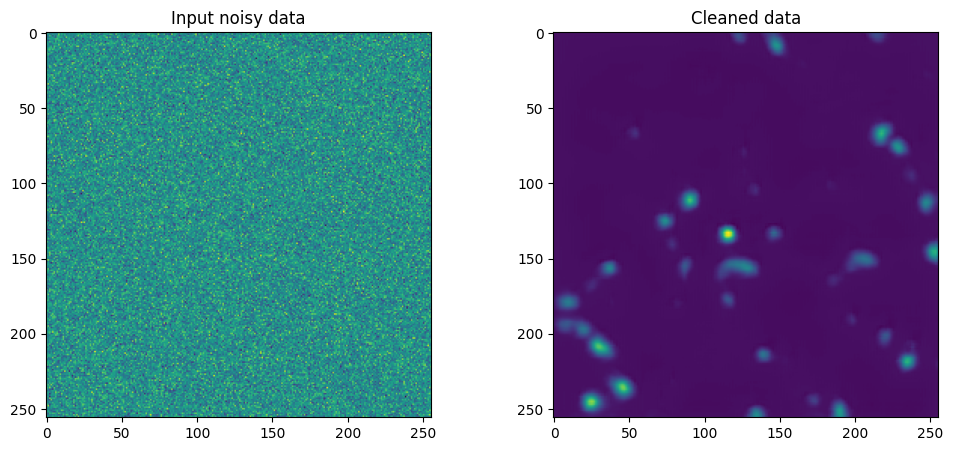

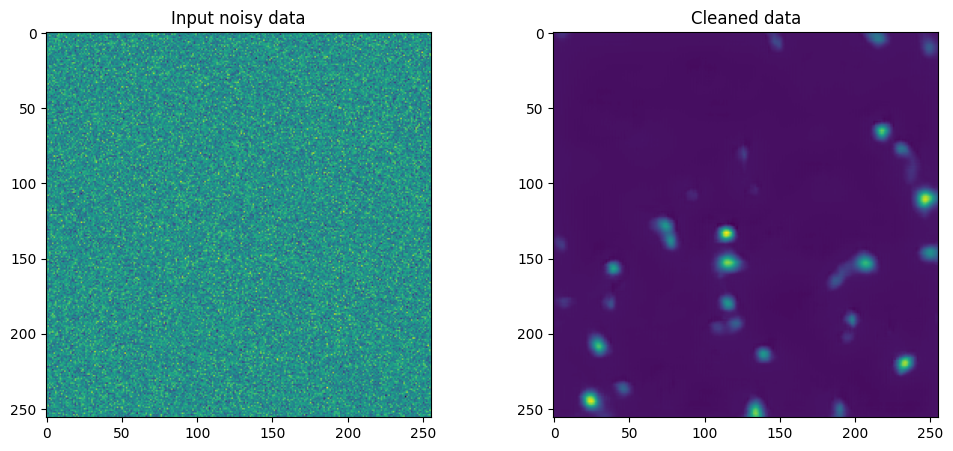

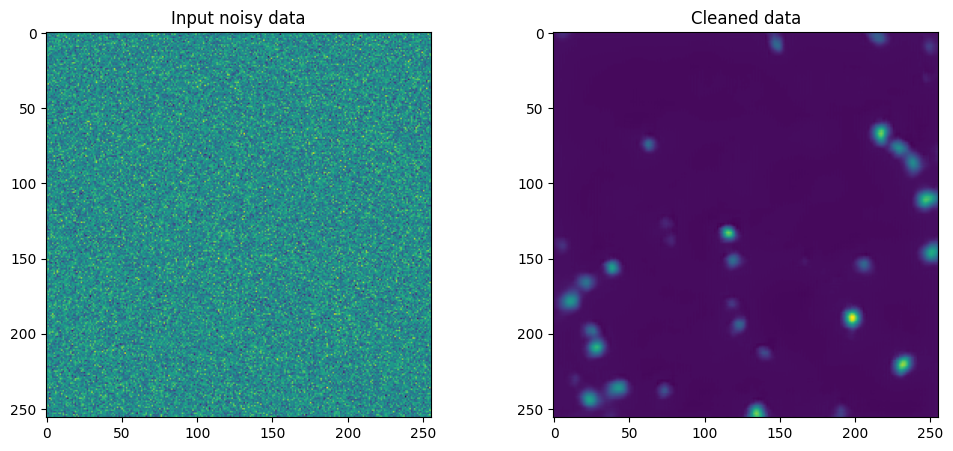

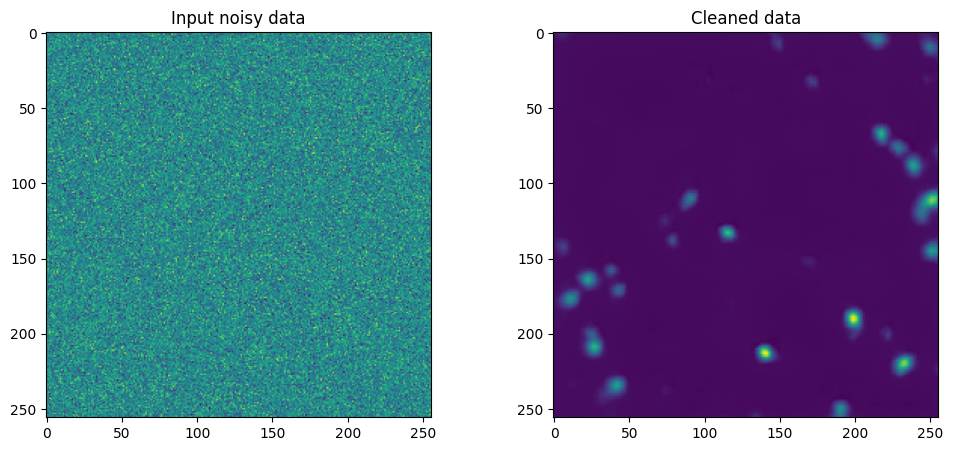

In [12]:
img = X_noisy_holdout[50:50+1]
for s in range(0, 100, 5):
    img = img + np.random.normal(scale=8+s, size=img.shape).astype(np.float32)
    prediction = denoiser.predict(img)
    _, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    ax1.imshow(img[0])
    ax2.imshow(prediction)
    ax1.set_title("Input noisy data")
    ax2.set_title("Cleaned data")
    plt.show()

Finally, let's apply it to experimental data. Note that the current model is by no means optimized to work with experimental data - we didn't even consider any scale changes. Still, it is interesting to see how it will perform on real-world data.

In [13]:
# download data
!gdown -O "graphene_exp.npy" https://drive.google.com/uc?id=18U8YHZUbSZj0Q1__zup5-ABrjaEZmiPc

Downloading...
From: https://drive.google.com/uc?id=18U8YHZUbSZj0Q1__zup5-ABrjaEZmiPc
To: /content/graphene_exp.npy
100% 4.19M/4.19M [00:00<00:00, 328MB/s]


In [14]:
# Load experimental iamge
expdata = np.load("graphene_exp.npy")

# Scale it to the range of pixel values used in training data
expdata_scaled = scale_to_training_range(expdata, X_noisy_train)

Visualize predictions:

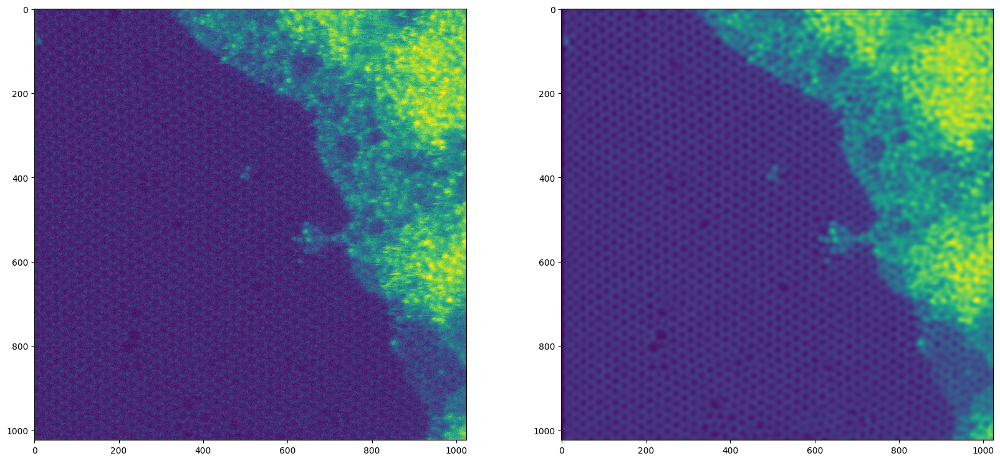

In [15]:
prediction = denoiser.predict(expdata_scaled)

_, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))
ax1.imshow(expdata_scaled)
ax2.imshow(prediction.squeeze())

Looks like a decent prediction!